# Packages

In [1]:
import pandas as pd
import numpy as np
import random
from datetime import date, datetime
from pandas.tseries.frequencies import to_offset
import os
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

sns.set_theme(style="darkgrid")
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
import copy
import yfinance as yf
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
import statsmodels.tsa.vector_ar.svar_model as svar
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.filters.hp_filter import hpfilter
from scipy.stats import pearsonr
import requests as req
import yfinance as yf
from googlefinance.get import get_code

from fredapi import Fred

fred = Fred(api_key="ef7244731efdde9698fef5d547b7094f")

from MA_functions import *

import filterpy  # for Kalman Filter
from nelson_siegel_svensson.calibrate import *
import rpy2
import io
import sdmx

# Pfade

In [2]:
path_ma_data = r"C:\Users\alexa\Documents\Studium\MSc (WU)\Master Thesis\Analysis\Data"
path_ma_figures = r"C:\Users\alexa\Documents\Studium\MSc (WU)\Master Thesis\Analysis"

# Data

## Macro Data

In [4]:
##### Data
# Industrial Production
# FRED: EA19PRINTO01GYSAM
# OECD: OECDPRINTO01GYSAM
ind_pro_ea = fred.get_series("OECDPRINTO01GYSAM")
ind_pro_ea.rename("INDPRO_EA", inplace=True)


# CPI
cpi_ea = fred.get_series("CP0000EZ19M086NEST")
cpi_ea.rename("CPI_EA", inplace=True)

# Inflation
infl_ea = fred.get_series("CPHPTT01EZM659N")
infl_ea.rename("Infl_EA", inplace=True)


# Short Term Interest Rate
ea_rate_3m = fred.get_series("IR3TIB01EZM156N")
ea_rate_3m.rename("EA_Rate_3M", inplace=True)

# Recession Indicator
# ea_rec = fred.get_series("EUROREC").dropna()
# ea_rec.rename("EA_REC", inplace=True)


# Stock Market
# eustx_50 = yf.download("^STOXX50E", start="2000-01-01", end="2024-01-01")

# eustx_50_m = eustx_50["Close"].resample("M", loffset="1d").mean()
# eustx_50_m.name = "EUSTX_50"

# eustx_50_m_ret = eustx_50_m.pct_change(periods=12).dropna() * 100
# eustx_50_m_ret.name = "EUSTX_50_YoY"

eustx_50_m = pd.read_csv(path_ma_data + "\\" + "EUSTX_50_Data.csv", index_col=[0])
eustx_50_m.index = pd.to_datetime(eustx_50_m.index)

eustx_50_m_ret = eustx_50_m.pct_change(periods=12).dropna() * 100
eustx_50_m_ret.rename(columns={"EUSTX50": "EUSTX_50_YoY"}, inplace=True)


###############################################################################
# Financial Stress
###############################################################################
# Credit Risk NF Sector
# see: https://publications.banque-france.fr/en/economic-and-financial-publications-working-papers/credit-risk-euro-area
credit_risk_ea = pd.read_excel(
    path_ma_data + "\\" + "gm_ea_credit_risk_indicators.xlsx",
    index_col=[0],
    # usecols=["spr_nfc_bund_ea"],
)

credit_risk_ea.index = pd.to_datetime(credit_risk_ea.index, format="%Ym%m")

# CISS Index
# entrypoint = "https://data-api.ecb.europa.eu/service"
# resource = "data"
# flowRef = "CISS"
# form = "?format=csvdata"

# key = "M.U2.Z0Z.4F.EC.SOV_GDPW.IDX"

# request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
# response = req.get(request_url)

# ciss_idx = pd.read_csv(
#     io.StringIO(response.text),
#     usecols=["TIME_PERIOD", "OBS_VALUE"],
#     index_col=["TIME_PERIOD"],
#     infer_datetime_format=True,
# )

# ciss_idx.index = pd.to_datetime(ciss_idx.index)

# ciss_idx.rename(columns={"OBS_VALUE": "CISS"}, inplace=True)

## ECB Yields
(https://data.ecb.europa.eu/data/data-categories/financial-markets-and-interest-rates/euro-area-yield-curves/aaa-rated-government-bonds-yield-curve/spot-curve)

In [5]:
# Yields

entrypoint = "https://data-api.ecb.europa.eu/service"
resource = "data"
flowRef = "YC"
form = "?format=csvdata"


# Yield 3 M
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_3M"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_3m_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_3m_ea.index = pd.to_datetime(yield_3m_ea.index)

yield_3m_ea.rename(columns={"OBS_VALUE": "Y3M"}, inplace=True)

yield_3m_ea_m = yield_3m_ea.resample("M", loffset="1d").mean()

# Yield 6M
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_6M"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_6m_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_6m_ea.index = pd.to_datetime(yield_6m_ea.index)

yield_6m_ea.rename(columns={"OBS_VALUE": "Y6M"}, inplace=True)

yield_6m_ea_m = yield_6m_ea.resample("M", loffset="1d").mean()

# Yield 9M
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_9M"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_9m_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_9m_ea.index = pd.to_datetime(yield_9m_ea.index)

yield_9m_ea.rename(columns={"OBS_VALUE": "Y9M"}, inplace=True)

yield_9m_ea_m = yield_9m_ea.resample("M", loffset="1d").mean()

# Yield 1Y
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_1Y"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_1y_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_1y_ea.index = pd.to_datetime(yield_1y_ea.index)

yield_1y_ea.rename(columns={"OBS_VALUE": "Y1Y"}, inplace=True)


yield_1y_ea_m = yield_1y_ea.resample("M", loffset="1d").mean()


# Yield 2Y
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_2Y"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_2y_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_2y_ea.index = pd.to_datetime(yield_2y_ea.index)

yield_2y_ea.rename(columns={"OBS_VALUE": "Y2Y"}, inplace=True)


yield_2y_ea_m = yield_2y_ea.resample("M", loffset="1d").mean()

# Yield 3Y
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_3Y"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_3y_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_3y_ea.index = pd.to_datetime(yield_3y_ea.index)

yield_3y_ea.rename(columns={"OBS_VALUE": "Y3Y"}, inplace=True)


yield_3y_ea_m = yield_3y_ea.resample("M", loffset="1d").mean()

# Yield 4Y
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_4Y"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_4y_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_4y_ea.index = pd.to_datetime(yield_4y_ea.index)

yield_4y_ea.rename(columns={"OBS_VALUE": "Y4Y"}, inplace=True)


yield_4y_ea_m = yield_4y_ea.resample("M", loffset="1d").mean()

# Yield 5Y
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_5Y"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_5y_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_5y_ea.index = pd.to_datetime(yield_5y_ea.index)

yield_5y_ea.rename(columns={"OBS_VALUE": "Y5Y"}, inplace=True)


yield_5y_ea_m = yield_5y_ea.resample("M", loffset="1d").mean()

# Yield 6Y
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_6Y"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_6y_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_6y_ea.index = pd.to_datetime(yield_6y_ea.index)

yield_6y_ea.rename(columns={"OBS_VALUE": "Y6Y"}, inplace=True)


yield_6y_ea_m = yield_6y_ea.resample("M", loffset="1d").mean()

# Yield 7Y
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_7Y"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_7y_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_7y_ea.index = pd.to_datetime(yield_7y_ea.index)

yield_7y_ea.rename(columns={"OBS_VALUE": "Y7Y"}, inplace=True)


yield_7y_ea_m = yield_7y_ea.resample("M", loffset="1d").mean()

# Yield 8Y
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_8Y"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_8y_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_8y_ea.index = pd.to_datetime(yield_8y_ea.index)

yield_8y_ea.rename(columns={"OBS_VALUE": "Y8Y"}, inplace=True)


yield_8y_ea_m = yield_8y_ea.resample("M", loffset="1d").mean()

# Yield 10Y
key = "B.U2.EUR.4F.G_N_A.SV_C_YM.SR_10Y"

request_url = entrypoint + "/" + resource + "/" + flowRef + "/" + key + form
response = req.get(request_url)

yield_10y_ea = pd.read_csv(
    io.StringIO(response.text),
    usecols=["TIME_PERIOD", "OBS_VALUE", "DATA_TYPE_FM"],
    index_col=["TIME_PERIOD"],
    infer_datetime_format=True,
)

yield_10y_ea.index = pd.to_datetime(yield_10y_ea.index)

yield_10y_ea.rename(columns={"OBS_VALUE": "Y10Y"}, inplace=True)


yield_10y_ea_m = yield_10y_ea.resample("M", loffset="1d").mean()

C:\Users\alexa\AppData\Local\Temp\ipykernel_3104\934044376.py:26: FutureWarning: 'loffset' in .resample() and in Grouper() is deprecated.

>>> df.resample(freq="3s", loffset="8H")

becomes:

>>> from pandas.tseries.frequencies import to_offset
>>> df = df.resample(freq="3s").mean()
>>> df.index = df.index.to_timestamp() + to_offset("8H")

  yield_3m_ea_m = yield_3m_ea.resample("M", loffset="1d").mean()
C:\Users\alexa\AppData\Local\Temp\ipykernel_3104\934044376.py:45: FutureWarning: 'loffset' in .resample() and in Grouper() is deprecated.

>>> df.resample(freq="3s", loffset="8H")

becomes:

>>> from pandas.tseries.frequencies import to_offset
>>> df = df.resample(freq="3s").mean()
>>> df.index = df.index.to_timestamp() + to_offset("8H")

  yield_6m_ea_m = yield_6m_ea.resample("M", loffset="1d").mean()
C:\Users\alexa\AppData\Local\Temp\ipykernel_3104\934044376.py:64: FutureWarning: 'loffset' in .resample() and in Grouper() is deprecated.

>>> df.resample(freq="3s", loffset="8H")

becomes

###  Data Preperation for R NS estimation

In [7]:
# Merge Yield Data for Nelson-Siegel decomposition in R
start_yields_ea = max(
    min(yield_3m_ea_m.index),
    min(yield_6m_ea_m.index),
    min(yield_9m_ea_m.index),
    min(yield_1y_ea_m.index),
    min(yield_2y_ea_m.index),
    min(yield_3y_ea_m.index),
    min(yield_4y_ea_m.index),
    min(yield_5y_ea_m.index),
    min(yield_6y_ea_m.index),
    min(yield_7y_ea_m.index),
    min(yield_8y_ea_m.index),
    min(yield_10y_ea_m.index),
)


end_yields_ea = min(
    max(yield_3m_ea_m.index),
    max(yield_6m_ea_m.index),
    max(yield_9m_ea_m.index),
    max(yield_1y_ea_m.index),
    max(yield_2y_ea_m.index),
    max(yield_3y_ea_m.index),
    max(yield_4y_ea_m.index),
    max(yield_5y_ea_m.index),
    max(yield_6y_ea_m.index),
    max(yield_7y_ea_m.index),
    max(yield_8y_ea_m.index),
    max(yield_10y_ea_m.index),
)


yields_ea_m = [
    yield_3m_ea_m.loc[start_yields_ea:end_yields_ea, "Y3M"],
    yield_6m_ea_m.loc[start_yields_ea:end_yields_ea, "Y6M"],
    yield_9m_ea_m.loc[start_yields_ea:end_yields_ea, "Y9M"],
    yield_1y_ea_m.loc[start_yields_ea:end_yields_ea, "Y1Y"],
    yield_2y_ea_m.loc[start_yields_ea:end_yields_ea, "Y2Y"],
    yield_3y_ea_m.loc[start_yields_ea:end_yields_ea, "Y3Y"],
    yield_4y_ea_m.loc[start_yields_ea:end_yields_ea, "Y4Y"],
    yield_5y_ea_m.loc[start_yields_ea:end_yields_ea, "Y5Y"],
    yield_6y_ea_m.loc[start_yields_ea:end_yields_ea, "Y6Y"],
    yield_7y_ea_m.loc[start_yields_ea:end_yields_ea, "Y7Y"],
    yield_8y_ea_m.loc[start_yields_ea:end_yields_ea, "Y8Y"],
    yield_10y_ea_m.loc[start_yields_ea:end_yields_ea, "Y10Y"],
]

yields_ea_m = pd.concat(yields_ea_m, axis=1)


yields_ea_m.to_csv(path_ma_data + "\\" + "Yields_EA.csv")

Estimated NS-Factors (in R)

<Axes: xlabel='TIME_PERIOD'>

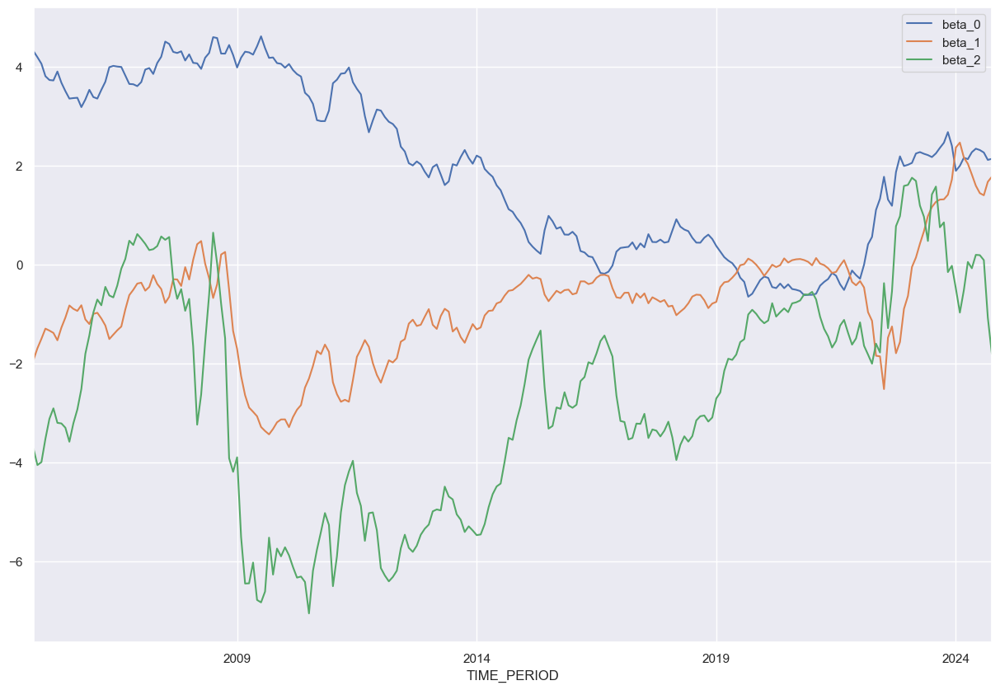

In [9]:
# Yieldcurve Factors own Calculation (in R using ECB Spot Yields)
yields_ea_m_r = pd.read_csv(
    path_ma_data + "\\" + "Yields_EA_R_v2.csv", 
    index_col=[0], 
    parse_dates=True, 
    infer_datetime_format=True
)


yields_ea_m_r.iloc[: , -4:-1].plot(figsize=(15,10))

In [31]:
yields_ea_m_r.index

DatetimeIndex(['2004-10-01', '2004-11-01', '2004-12-01', '2005-01-01',
               '2005-02-01', '2005-03-01', '2005-04-01', '2005-05-01',
               '2005-06-01', '2005-07-01',
               ...
               '2024-01-01', '2024-02-01', '2024-03-01', '2024-04-01',
               '2024-05-01', '2024-06-01', '2024-07-01', '2024-08-01',
               '2024-09-01', '2024-10-01'],
              dtype='datetime64[ns]', name='TIME_PERIOD', length=241, freq=None)

### Yield Curve Factors Approximations

In [41]:
# Get Approximations for Coefficients (see Diebold et al. (2006))
# Beta 0 - Level Factor
yields_ea_m_r["(y(3) + y(24) + y(120))/3"] = np.nan

for t in yields_ea_m_r.index:
    yield_3m = yields_ea_m_r.loc[t, "Y3M"]
    yield_2y = yields_ea_m_r.loc[t, "Y2Y"]
    yield_10y = yields_ea_m_r.loc[t, "Y10Y"]
    
    result_beta_0 = get_beta_0_approx(yields_ea_m_r, 
                                      time=t,
                                      yield_1="Y3M",
                                      yield_2="Y2Y",
                                      yield_3="Y10Y")
    
    yields_ea_m_r.loc[t, "(y(3) + y(24) + y(120))/3"] = result_beta_0
    
# Beta 1 - Slope Factor
yields_ea_m_r["y(3) - y(120)"] = yields_ea_m_r["Y3M"] - yields_ea_m_r["Y10Y"]


# Beta 2 - Curvature Factor
yields_ea_m_r["2 * y(24) - y(120) - y(3)"] = (
    2 * yields_ea_m_r["Y2Y"] - yields_ea_m_r["Y10Y"] - yields_ea_m_r["Y3M"]
)

## Concat Data

In [21]:
# Merge EA Data
start_ea = max(
    min(ind_pro_ea.index),
    min(infl_ea.index),
    min(ea_rate_3m.index),
    min(eustx_50_m_ret.index),
    # min(ciss_idx.index),
    min(yields_ea_m_r.index),
    # min(ea_rec.index),
    min(credit_risk_ea.index),
)


end_ea = min(
    max(ind_pro_ea.index),
    max(infl_ea.index),
    max(ea_rate_3m.index),
    max(eustx_50_m_ret.index),
    # max(ciss_idx.index),
    max(yields_ea_m_r.index),
    # max(ea_rec.index),
    max(credit_risk_ea.index),
)


df_ea = [
    ind_pro_ea[start_ea:end_ea],
    infl_ea[start_ea:end_ea],
    ea_rate_3m[start_ea:end_ea],
    eustx_50_m_ret[start_ea:end_ea],
    # ciss_idx.loc[start_ea:end_ea],
    yields_ea_m_r[start_ea:end_ea],
    # ea_rec.loc[start_ea:end_ea],
    credit_risk_ea.loc[start_ea:end_ea, "spr_nfc_bund_ea"],
]

df_ea = pd.concat(df_ea, axis=1).dropna()

## EABCN Recession Dates
see: https://eabcn.org/dbc/peaksandtroughs/chronology-euro-area-business-cycles

In [22]:
# EA_Recession Subset
# Recession Dates based on EABCN Peaks and Troughs
ea_rec_dates = {
    "rec_1": ["2008-04-01", "2009-07-01"],
    "rec_2": ["2011-10-01", "2013-04-01"],
    "rec_3": ["2020-01-01", "2020-07-01"],
}

# empty list where each recession month is added
ea_rec_months = []

# loop through recession dates dictionary
for rec, dates in ea_rec_dates.items():
    start_date, end_date = dates
    # get all months where a recession occured according to EABCN
    rec_range = pd.date_range(start=start_date, end=end_date, freq="MS")
    for rec_month in rec_range:
        # append each recession month
        ea_rec_months.append(rec_month)

# Create EA Recession df with 0
ea_rec = pd.Series(0, index=df_ea.index)

# subset EA Recession df with all recession month and
# set the values to 1 (1=recession occured in month p)
ea_rec.loc[ea_rec.index.isin(ea_rec_months)] = 1

# Plots

### Factor Figure

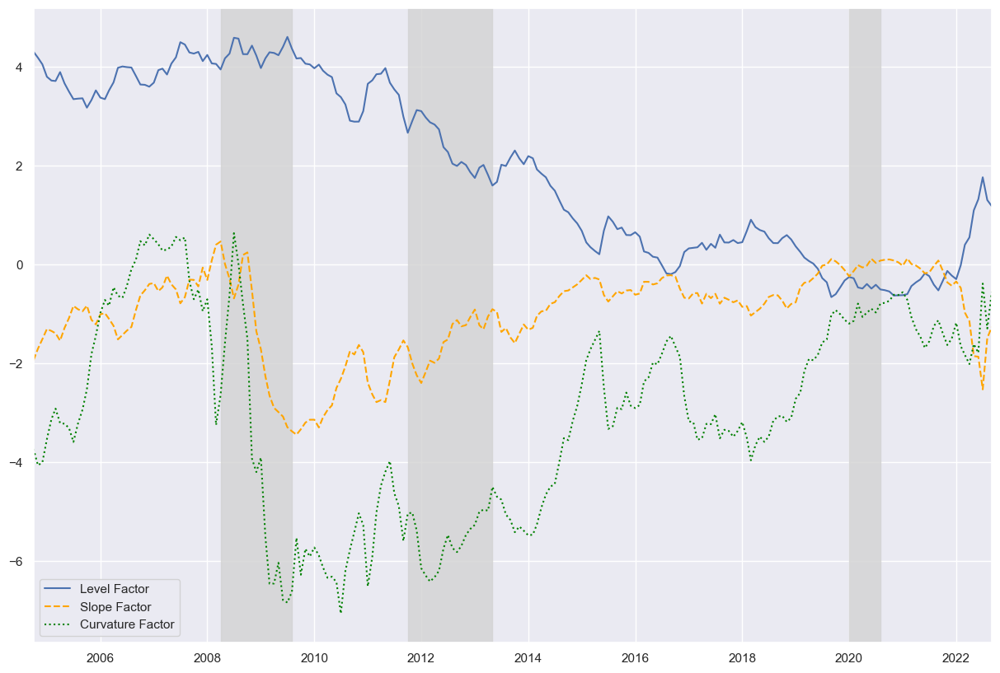

In [42]:
plt.figure(figsize=(15, 10))
plt.plot(yields_ea_m_r.loc[start_ea:end_ea, "beta_0"], label="Level Factor", color="b")
plt.plot(
    yields_ea_m_r.loc[start_ea:end_ea, "beta_1"],
    label="Slope Factor",
    color="orange",
    linestyle="--",
)
plt.plot(
    yields_ea_m_r.loc[start_ea:end_ea, "beta_2"],
    label="Curvature Factor",
    color="green",
    linestyle=":",
)

# Automatically set the x-axis limits to include all values, starting and stopping at the first and last index
plt.xlim(df_ea.index[0], df_ea.index[-1])

# Adding recession bars
start_date = None  # Initialize start_date to None
for i in range(1, len(ea_rec)):
    if ea_rec.iloc[i] == 1 and ea_rec.iloc[i - 1] == 0:
        start_date = ea_rec.index[i]
    if ea_rec.iloc[i] == 0 and ea_rec.iloc[i - 1] == 1:
        end_date = ea_rec.index[i]
        plt.axvspan(start_date, end_date, color="lightgray", alpha=0.8)
        start_date = None  # Reset start_date after plotting

# Handle the case where the series ends in a recession
if start_date is not None:
    plt.axvspan(start_date, yields_ea_m_r.index[-1], color="lightgray", alpha=0.8)

plt.legend()
plt.savefig(path_ma_figures + "\\" + "Factors_Figure_EA_1.pdf", dpi=1000)
plt.show()


### Level Factor and Inflation

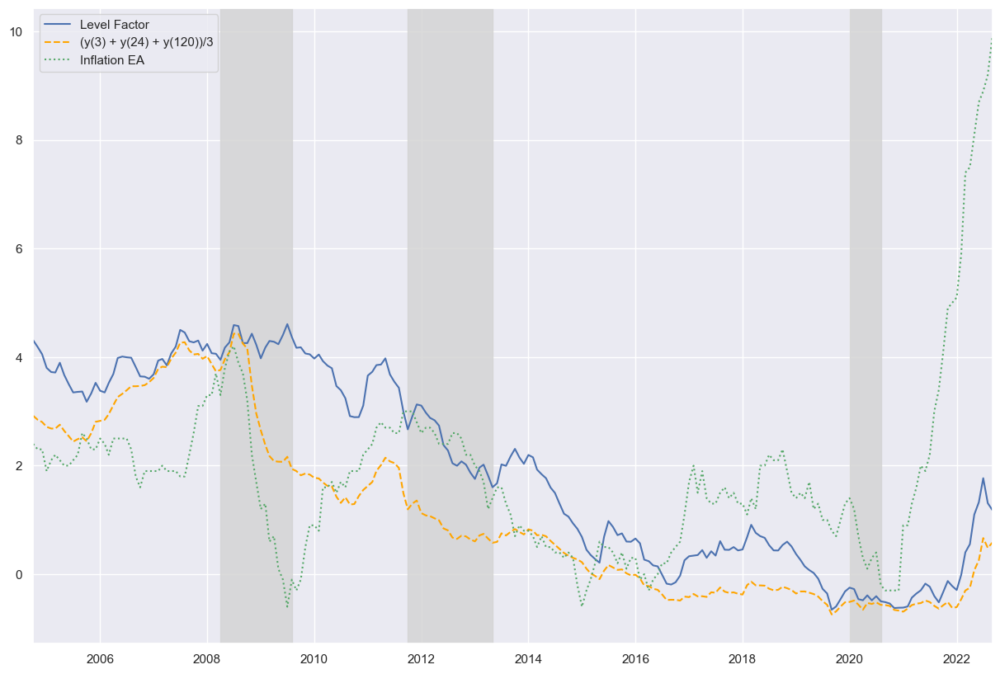

In [43]:
# Beta 0
plt.figure(figsize=(15, 10))
plt.plot(yields_ea_m_r.loc[start_ea:end_ea, "beta_0"], label="Level Factor", color="b")
plt.plot(
    yields_ea_m_r.loc[start_ea:end_ea, "(y(3) + y(24) + y(120))/3"],
    label="(y(3) + y(24) + y(120))/3",
    linestyle="--",
    color="orange",
)
plt.plot(infl_ea.loc[start_ea:end_ea], label="Inflation EA", linestyle=":", color="g")

# Automatically set the x-axis limits to include all values, starting and stopping at the first and last index
plt.xlim(df_ea.index[0], df_ea.index[-1])

# Adding recession bars
start_date = None  # Initialize start_date to None
for i in range(1, len(ea_rec)):
    if ea_rec.iloc[i] == 1 and ea_rec.iloc[i - 1] == 0:
        start_date = ea_rec.index[i]
    if ea_rec.iloc[i] == 0 and ea_rec.iloc[i - 1] == 1:
        end_date = ea_rec.index[i]
        plt.axvspan(start_date, end_date, color="lightgray", alpha=0.8)
        start_date = None  # Reset start_date after plotting

# Handle the case where the series ends in a recession
if start_date is not None:
    plt.axvspan(start_date, yields_ea_m_r.index[-1], color="lightgray", alpha=0.8)

plt.legend()
plt.savefig(path_ma_figures + "\\" + "Beta_0_Figure_EA_1.pdf", dpi=1000)
plt.show()


### Slope Factor and Industrial Production

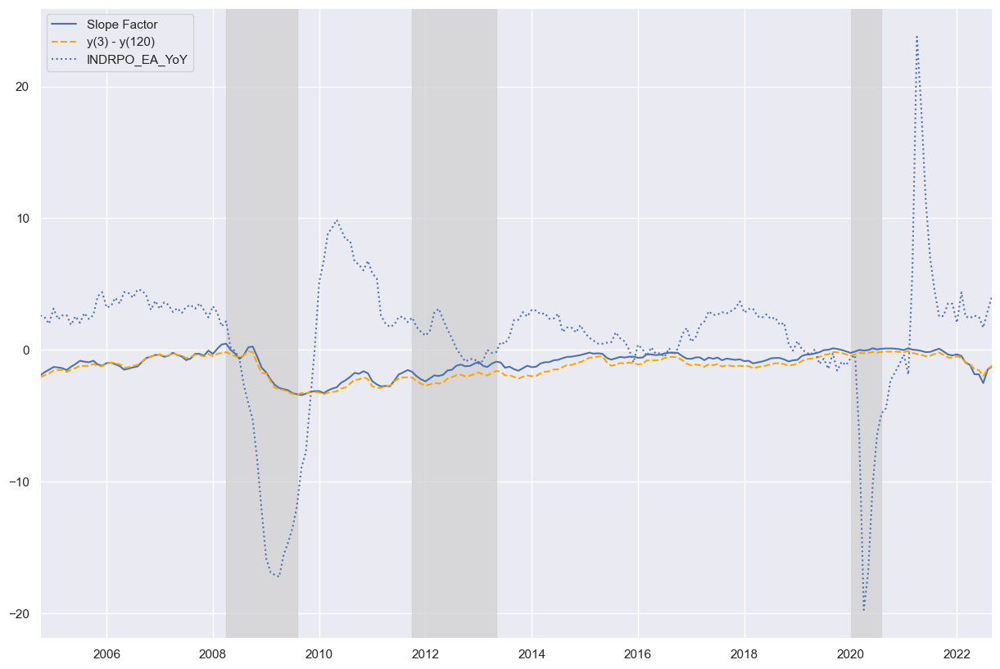

In [47]:
# Beta 1
plt.figure(figsize=(15, 10))
plt.plot(yields_ea_m_r.loc[start_ea:end_ea, "beta_1"], label="Slope Factor", color="b")

plt.plot(
    yields_ea_m_r.loc[start_ea:end_ea, "y(3) - y(120)"],
    label="y(3) - y(120)",
    color="orange",
    linestyle="--",
)

plt.plot(df_ea.loc[start_ea:end_ea, "INDPRO_EA"], label="INDRPO_EA_YoY", linestyle=":")

# Automatically set the x-axis limits to include all values, starting and stopping at the first and last index
plt.xlim(df_ea.index[0], df_ea.index[-1])

# Adding recession bars
start_date = None  # Initialize start_date to None
for i in range(1, len(ea_rec)):
    if ea_rec.iloc[i] == 1 and ea_rec.iloc[i - 1] == 0:
        start_date = ea_rec.index[i]
    if ea_rec.iloc[i] == 0 and ea_rec.iloc[i - 1] == 1:
        end_date = ea_rec.index[i]
        plt.axvspan(start_date, end_date, color="lightgray", alpha=0.8)
        start_date = None  # Reset start_date after plotting

# Handle the case where the series ends in a recession
if start_date is not None:
    plt.axvspan(start_date, yields_ea_m_r.index[-1], color="lightgray", alpha=0.8)

plt.legend()
plt.savefig(path_ma_figures + "\\" + "Beta_1_Figure_EA_1.pdf", dpi=1000)
plt.show()

### Curvature Factor

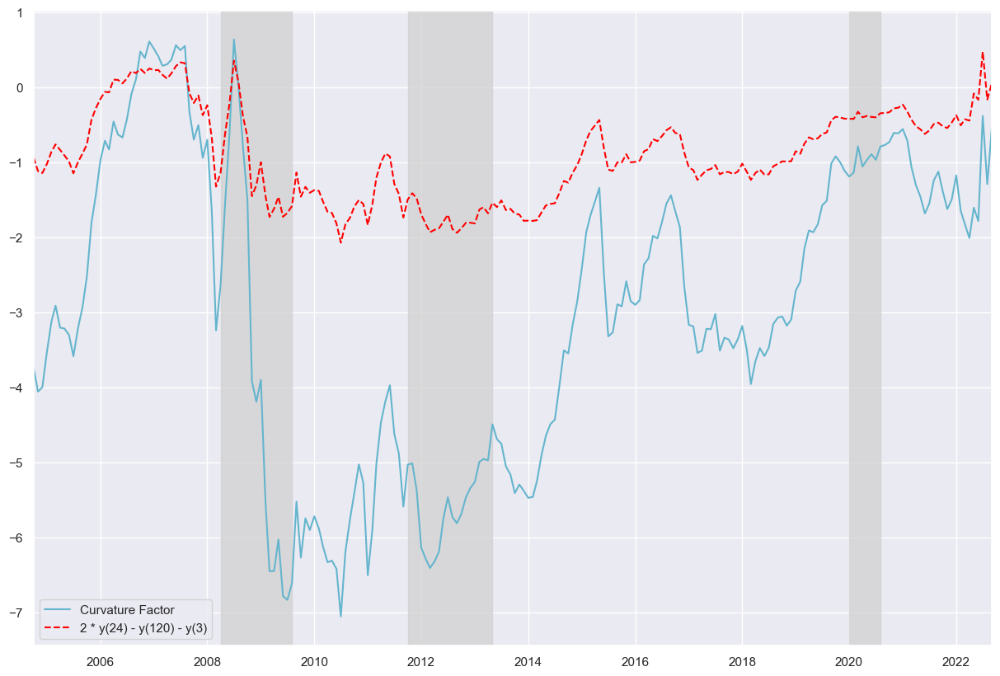

In [50]:
# Beta 2
plt.figure(figsize=(15, 10))
plt.plot(
    yields_ea_m_r.loc[start_ea:end_ea, "beta_2"], label="Curvature Factor", color="c"
)

plt.plot(
    yields_ea_m_r.loc[start_ea:end_ea, "2 * y(24) - y(120) - y(3)"],
    label="2 * y(24) - y(120) - y(3)",
    color="red",
    linestyle="--",
)

# Automatically set the x-axis limits to include all values, starting and stopping at the first and last index
plt.xlim(df_ea.index[0], df_ea.index[-1])

# Adding recession bars
start_date = None  # Initialize start_date to None
for i in range(1, len(ea_rec)):
    if ea_rec.iloc[i] == 1 and ea_rec.iloc[i - 1] == 0:
        start_date = ea_rec.index[i]
    if ea_rec.iloc[i] == 0 and ea_rec.iloc[i - 1] == 1:
        end_date = ea_rec.index[i]
        plt.axvspan(start_date, end_date, color="lightgray", alpha=0.8)
        start_date = None  # Reset start_date after plotting

# Handle the case where the series ends in a recession
if start_date is not None:
    plt.axvspan(start_date, yields_ea_m_r.index[-1], color="lightgray", alpha=0.8)

plt.legend()
plt.savefig(path_ma_figures + "\\" + "Beta_2_Figure_EA_1.pdf", dpi=1000)
plt.show()

Correlations NS-Factors and Approximations

In [52]:
pearsonr(
    yields_ea_m_r.loc[start_ea:end_ea, "beta_0"],
    yields_ea_m_r.loc[start_ea:end_ea, "(y(3) + y(24) + y(120))/3"],
)

PearsonRResult(statistic=0.9294234541955972, pvalue=1.3034871171366985e-94)

In [53]:
pearsonr(df_ea.loc[start_ea:end_ea, "beta_0"], df_ea.loc[start_ea:end_ea, "Infl_EA"])

PearsonRResult(statistic=0.1711634962410302, pvalue=0.0117486818839015)

In [54]:
pearsonr(
    yields_ea_m_r.loc[start_ea:end_ea, "beta_1"],
    yields_ea_m_r.loc[start_ea:end_ea, "y(3) - y(120)"],
)

PearsonRResult(statistic=0.9614169546175949, pvalue=6.346838811763086e-122)

In [61]:
pearsonr(df_ea["INDPRO_EA"], df_ea["beta_1"])

PearsonRResult(statistic=0.08257945021097093, pvalue=0.22678260790505259)

In [58]:
pearsonr(
    yields_ea_m_r.loc[start_ea:end_ea, "beta_2"],
    yields_ea_m_r.loc[start_ea:end_ea, "2 * y(24) - y(120) - y(3)"],
)

PearsonRResult(statistic=0.9613361334554787, pvalue=7.905296459199486e-122)

In [59]:
pearsonr(df_ea.beta_1, df_ea.beta_2)

PearsonRResult(statistic=0.7243618177165586, pvalue=2.041829110350087e-36)

# Analysis

In [65]:
df_analysis_ea = [
    df_ea["INDPRO_EA"],
    df_ea["Infl_EA"],
    df_ea["EA_Rate_3M"],
    # df_ea["CISS"],
    df_ea["spr_nfc_bund_ea"],
    df_ea["beta_0"],
    df_ea["beta_1"],
    df_ea["beta_2"],
    df_ea["EUSTX_50_YoY"],
]

df_analysis_ea = pd.concat(df_analysis_ea, axis=1)

df_analysis_ea.rename(
    columns={
        "INDPRO_EA": "IP_EA",
        "beta_0": "L_EA",
        "beta_1": "S_EA",
        "beta_2": "C_EA",
        "EUSTX_50_YoY": "EUSTX_50",
        "spr_nfc_bund_ea": "FS_EA",
    },
    inplace=True,
)

## Augmented Dickey-Fuller Test

In [64]:
adf_test_ea = get_adf(df_analysis_ea)

col_names_adf = ["t-Statistic", "Critical value", "p-value"]

df_adf_ea = pd.DataFrame.from_dict(adf_test_ea, orient="index", columns=col_names_adf)

df_adf_ea.index = [
    "$IP^{EA}_{t}$",
    "$\\pi^{EA}_{t}$",
    "$i^{EA}_{t}$",
    "$FS^{EA}_{t}$",
    "$L^{EA}_{t}$",
    "$S^{EA}_{t}$",
    "$C^{EA}_{t}$",
    "$M^{EA}_{t}$",
]


print(df_adf_ea.round(4).to_latex(escape=False))

\begin{tabular}{lrrr}
\toprule
{} &  t-Statistic &  Critical value &  p-value \\
\midrule
$IP^{EA}_{t}$  &      -3.0298 &         -2.8760 &   0.0322 \\
$\pi^{EA}_{t}$ &      -0.8543 &         -2.8760 &   0.8027 \\
$i^{EA}_{t}$   &      -1.5388 &         -2.8761 &   0.5143 \\
$FS^{EA}_{t}$  &      -3.1743 &         -2.8751 &   0.0215 \\
$L^{EA}_{t}$   &      -1.3095 &         -2.8751 &   0.6248 \\
$S^{EA}_{t}$   &      -2.2388 &         -2.8753 &   0.1925 \\
$C^{EA}_{t}$   &      -1.7449 &         -2.8758 &   0.4082 \\
$M^{EA}_{t}$   &      -2.9763 &         -2.8759 &   0.0372 \\
\bottomrule
\end{tabular}



C:\Users\alexa\AppData\Local\Temp\ipykernel_3104\3570813023.py:19: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_adf_ea.round(4).to_latex(escape=False))


## Estimate sVAR

IRFs for each lag and Table with Information Criteria is provided

In [68]:
os.chdir(path_ma_figures) # damit Figures im richtigen Pfad gespeichert werden

c:\Users\alexa\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Figure IRF_EA_lag_1.pdf has been saved!


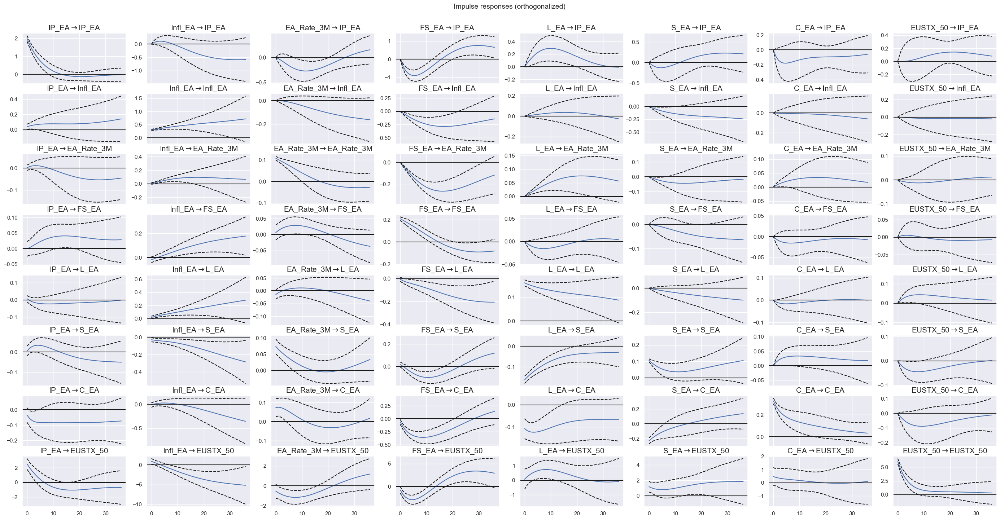

Figure IRF_EA_lag_2.pdf has been saved!


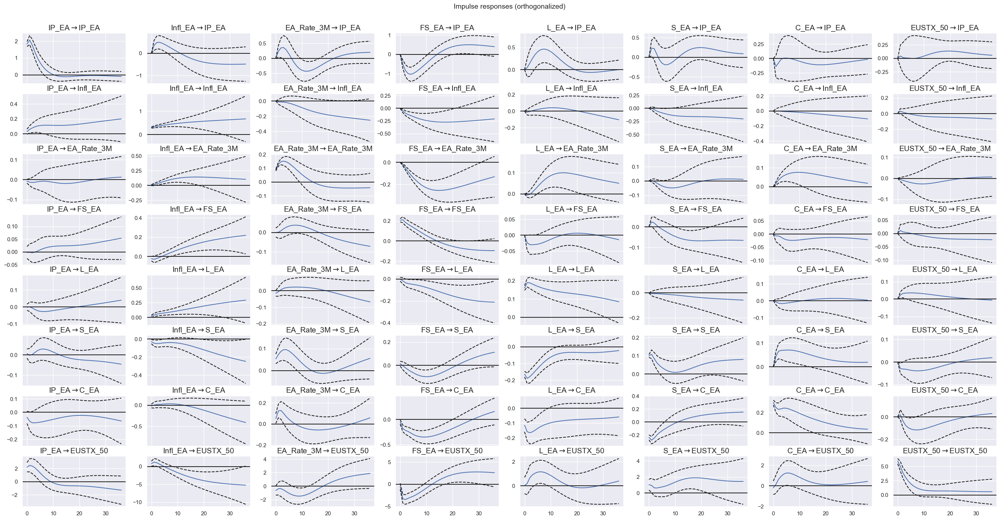

Figure IRF_EA_lag_3.pdf has been saved!


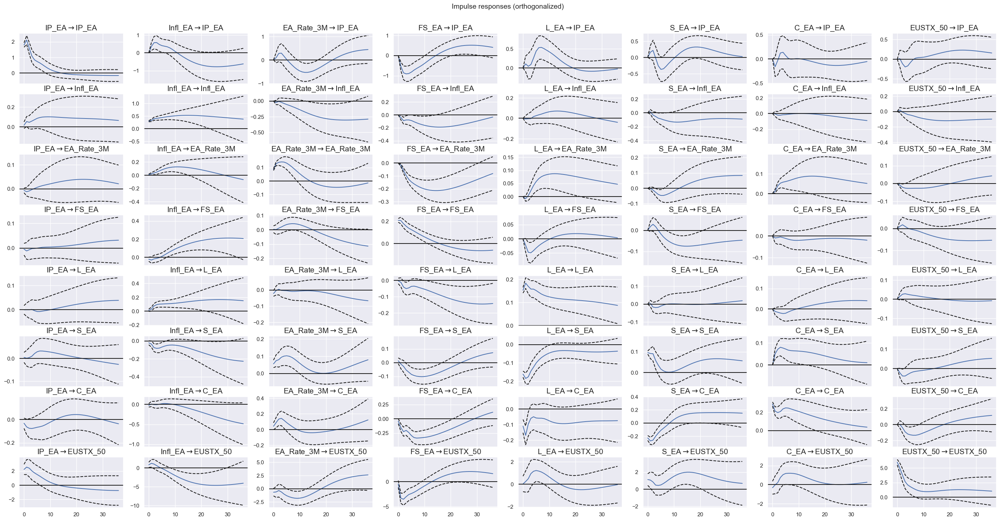

Figure IRF_EA_lag_4.pdf has been saved!


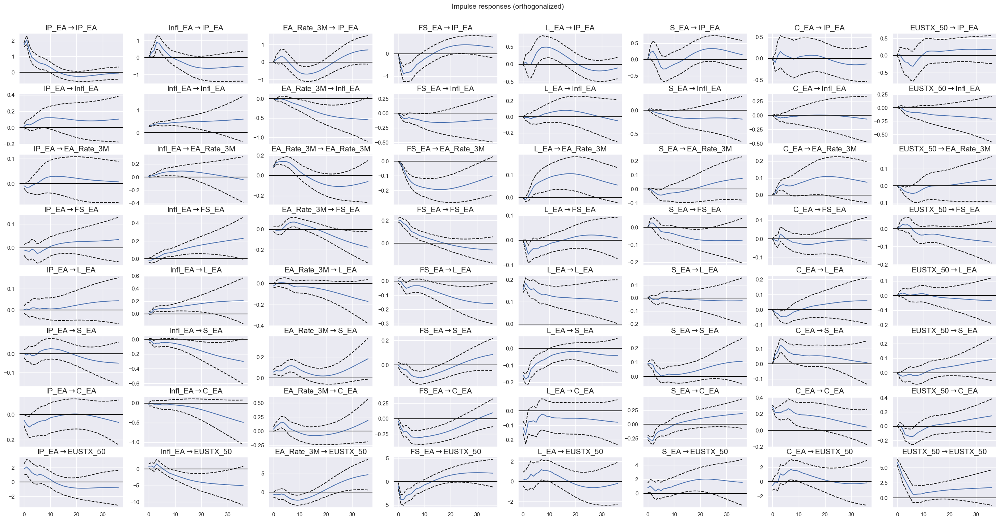

Figure IRF_EA_lag_5.pdf has been saved!


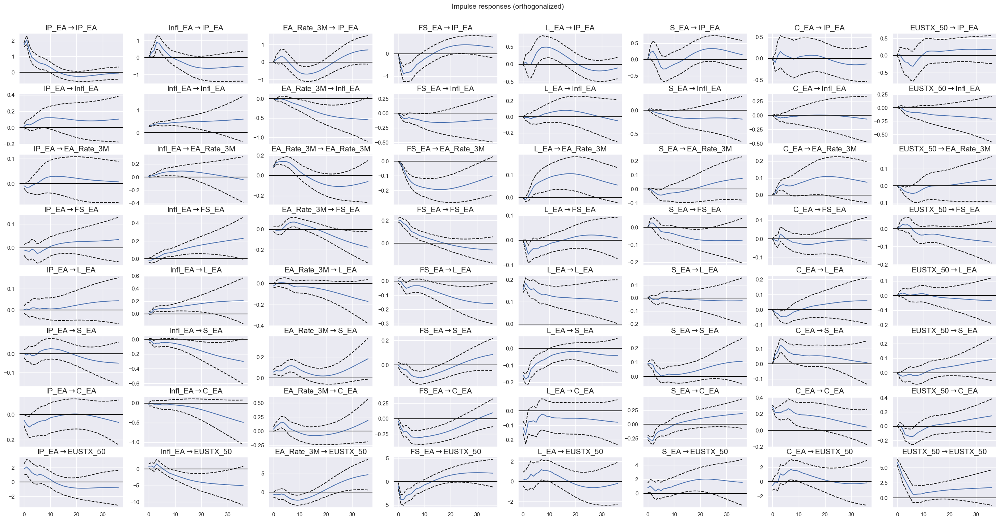

Figure IRF_EA_lag_6.pdf has been saved!


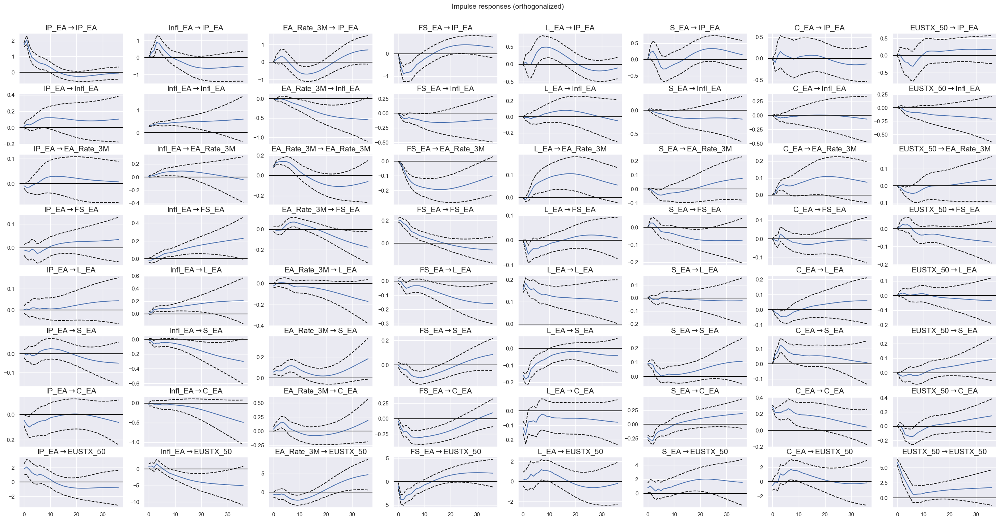

Figure IRF_EA_lag_7.pdf has been saved!


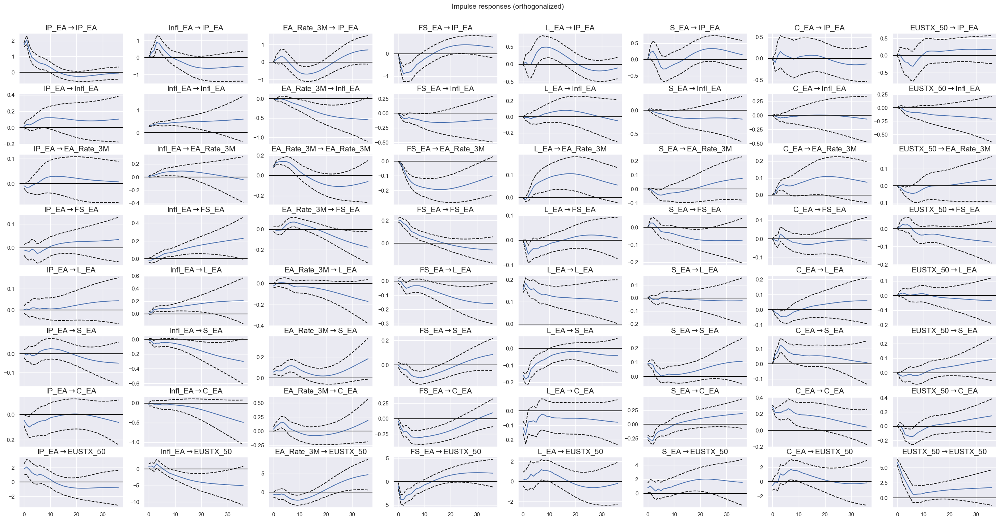

Figure IRF_EA_lag_8.pdf has been saved!


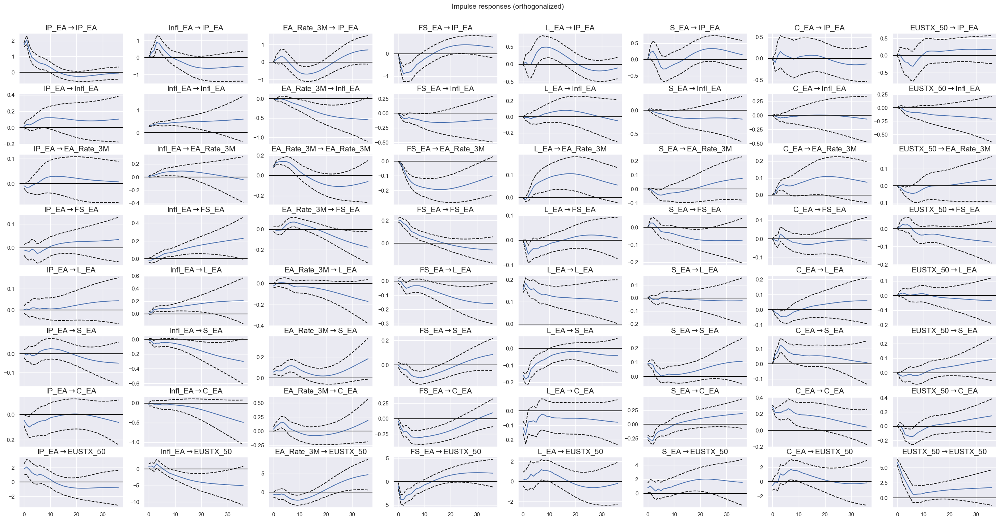

Figure IRF_EA_lag_9.pdf has been saved!


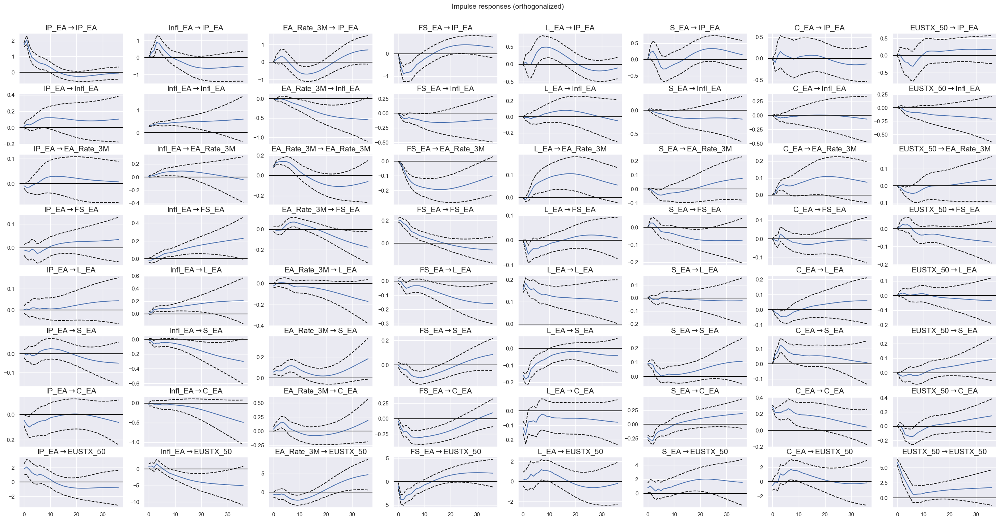

Figure IRF_EA_lag_10.pdf has been saved!


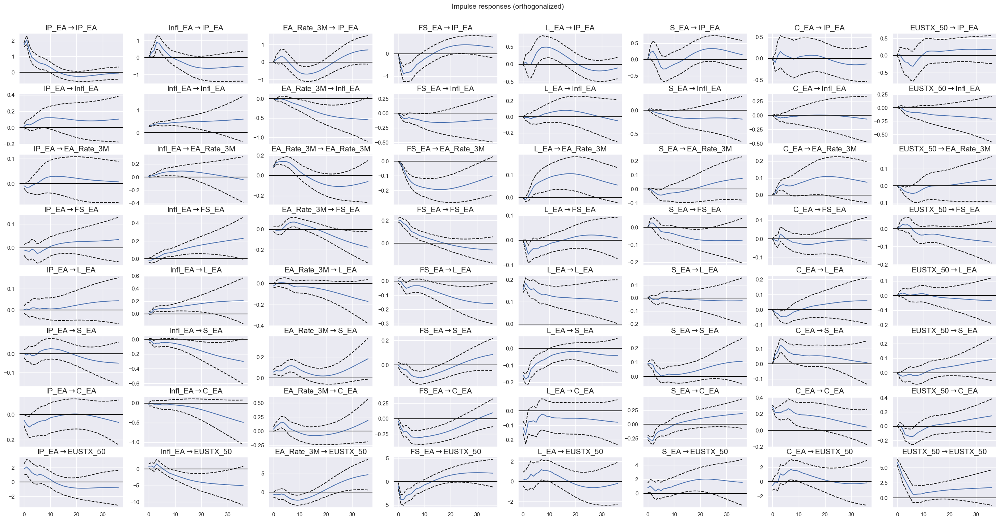

Figure IRF_EA_lag_11.pdf has been saved!


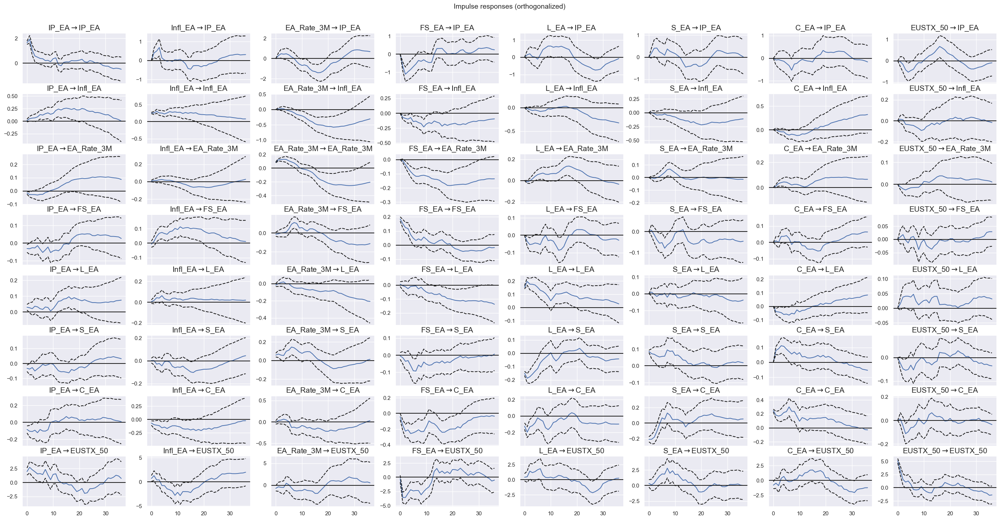

Figure IRF_EA_lag_12.pdf has been saved!


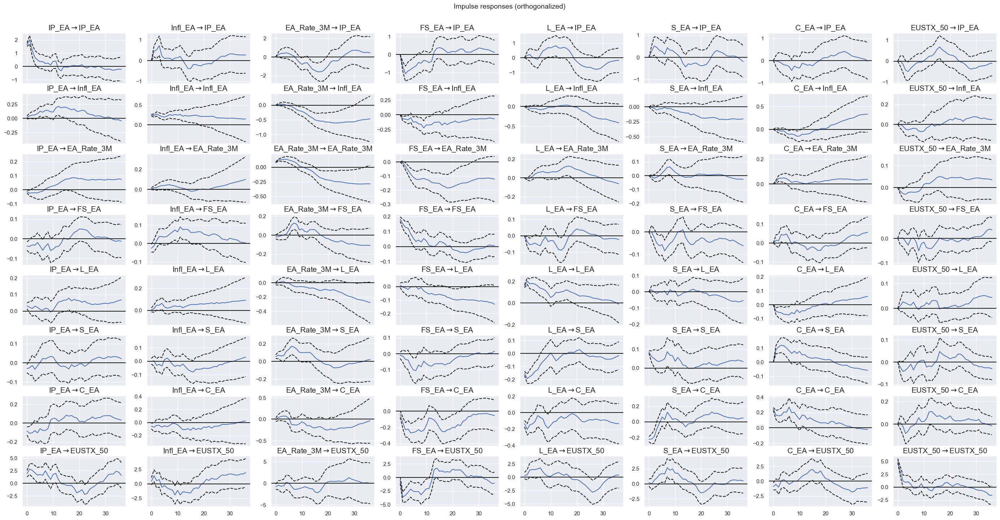

\begin{tabular}{lrrrr}
\toprule
   Lag &  Log-Likelihood &      AIC &      BIC &     HQIC \\
\midrule
 $p=1$ &       -747.0395 & -15.0840 & -13.9553 & -14.6280 \\
 $p=2$ &       -604.0538 & -15.7866 & -13.6475 & -14.9222 \\
 $p=3$ &       -535.1140 & -15.8005 & -12.6444 & -14.5250 \\
 $p=4$ &       -466.9773 & -15.8070 & -11.6271 & -14.1176 \\
 $p=5$ &       -466.9773 & -15.8070 & -11.6271 & -14.1176 \\
 $p=6$ &       -466.9773 & -15.8070 & -11.6271 & -14.1176 \\
 $p=7$ &       -466.9773 & -15.8070 & -11.6271 & -14.1176 \\
 $p=8$ &       -466.9773 & -15.8070 & -11.6271 & -14.1176 \\
 $p=9$ &       -466.9773 & -15.8070 & -11.6271 & -14.1176 \\
$p=10$ &       -466.9773 & -15.8070 & -11.6271 & -14.1176 \\
$p=11$ &          8.2485 & -15.8371 &  -4.2958 & -11.1689 \\
$p=12$ &         82.5094 & -15.9041 &  -3.2822 & -10.7983 \\
\bottomrule
\end{tabular}

\begin{tabular}{lrrrr}
\toprule
   Lag &  Log-Likelihood &    AIC &    BIC &   HQIC \\
\midrule
 $p=1$ &         -747.04 & -15.08 & -13.96 

c:\Users\alexa\Documents\Studium\MSc (WU)\Master Thesis\Analysis\Code\MA_functions.py:144: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_ic.to_latex(index=False, escape=False, float_format="%.4f"))
C:\Users\alexa\AppData\Local\Temp\ipykernel_3104\1646190130.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_ic_test.to_latex(index=False, escape=False, float_format="%.2f"))


In [69]:
df_ic_test = get_svars(df_analysis_ea, lag_start=1, lag_end=12, geography="EA")
print(df_ic_test.to_latex(index=False, escape=False, float_format="%.2f"))

## Grange Causality Tests

Chosen Model

In [33]:
# Estimate sVAR
model_us = VAR(df_analysis_us)
print(model_us.select_order())

result = model_us.fit(maxlags=6, ic="aic")

# print(result.test_whiteness())
print(result.is_stable())

residuals = result.sigma_u
resid_chol_decomp = np.linalg.cholesky(residuals).astype(np.float64)

c:\Users\alexa\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 17, BIC -> 1, FPE -> 17, HQIC ->  2>
True


In [34]:
llf_us = {"Log-Likelihood": result.llf}
aic_us = {"AIC": result.aic}
bic_us = {"BIC": result.bic}
hqic_us = {"HQIC": result.hqic}

dict_ic_us = {**llf_us, **aic_us, **bic_us, **hqic_us}
print(pd.DataFrame.from_dict(dict_ic_us, orient="index").round(4).to_latex())


\begin{tabular}{lr}
\toprule
{} &          0 \\
\midrule
Log-Likelihood & -3954.3057 \\
AIC            &    -8.1520 \\
BIC            &    -6.6293 \\
HQIC           &    -7.5580 \\
\bottomrule
\end{tabular}



C:\Users\alexa\AppData\Local\Temp\ipykernel_4112\1940486351.py:7: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(pd.DataFrame.from_dict(dict_ic_us, orient="index").round(4).to_latex())


### Macro To Yield Curve

In [35]:
# Block Granger Causality
# Macro to Yield Curve
granger_result = result.test_causality(
    ["L_US", "S_US", "C_US"], ["IP_US", "Infl_US", "FFR"], kind="wald"
)

# print(granger_result.summary())

result_macro_us = granger_result.summary()

df_result_macro_us = pd.DataFrame(result_macro_us[1:], columns=result_macro_us[0])

df_result_macro_us.iloc[0, 1]

print(df_result_macro_us.to_latex())

\begin{tabular}{lllll}
\toprule
{} &     Test statistic &      Critical value &                p-value &  df \\
\midrule
0 &  78.37779099857889 &  40.113272069413625 &  6.635216625842672e-07 &  27 \\
\bottomrule
\end{tabular}



C:\Users\alexa\AppData\Local\Temp\ipykernel_4112\3773339749.py:15: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_result_macro_us.to_latex())


### Yield Curve to Macro

In [36]:
# Yield Curve to Macro
granger_result = result.test_causality(
    ["IP_US", "Infl_US", "FFR"], ["L_US", "S_US", "C_US"], kind="wald"
)

# print(granger_result.summary())

result_yc_us = granger_result.summary()

df_result_yc_us = pd.DataFrame(result_yc_us[1:], columns=result_yc_us[0])

print(df_result_yc_us.to_latex())

\begin{tabular}{lllll}
\toprule
{} &      Test statistic &      Critical value &                 p-value &  df \\
\midrule
0 &  1129.6180858024702 &  40.113272069413625 &  7.618822467917976e-221 &  27 \\
\bottomrule
\end{tabular}



C:\Users\alexa\AppData\Local\Temp\ipykernel_4112\1331245647.py:12: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(df_result_yc_us.to_latex())
